<a href="https://colab.research.google.com/github/plaban1981/POCs/blob/main/Text_extraction_from_image.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Text Detection and Extraction using OpenCV and Easy OCR

If wewant to have text detection and recognition using a single function, then  AI-based Opensource Easy OCR. It supports 70+ languages and faster GPU Inference.

In [1]:
!pip install --quiet easyocr

     |████████████████████████████████| 63.6 MB 1.1 MB/s 
     |████████████████████████████████| 47.6 MB 1.1 MB/s 


In [2]:
from google.colab import files
files.upload()

Saving quotes-1637676373380-6320.jpg to quotes-1637676373380-6320.jpg
Saving quotes-1637676354701-1589.jpg to quotes-1637676354701-1589.jpg
Saving good-1637676331115-7109.jpg to good-1637676331115-7109.jpg
Saving quotes-1637676308727-1505.jpg to quotes-1637676308727-1505.jpg


{'good-1637676331115-7109.jpg': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01\x00`\x00`\x00\x00\xff\xfe\x00<CREATOR: gd-jpeg v1.0 (using IJG JPEG v62), quality = 100\n\xff\xdb\x00C\x00\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\xff\xdb\x00C\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\xff\xc0\x00\x11\x08\x048\x07\x80\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x0

In [3]:
# Import required packages
import cv2
import easyocr
import argparse
import cv2


In [12]:
#reader = easyocr.Reader(['hi'],gpu=True)# hi stands for hindi
reader = easyocr.Reader(['en'])
img = cv2.imread("/content/quotes-1637676373380-6320.jpg")
results = reader.readtext(img)

In [18]:
img = cv2.imread("/content/quotes-1637676354701-1589.jpg")

In [19]:
results = reader.readtext(img)

In [20]:
results

[([[732, 780], [3129, 780], [3129, 1002], [732, 1002]],
  'A leader who produces other',
  0.9804272045631689),
 ([[724, 1025], [3094, 1025], [3094, 1206], [724, 1206]],
  'leaders multiples their influences:',
  0.99240911650077),
 ([[1690, 1306], [2153, 1306], [2153, 1370], [1690, 1370]],
  'John C Maxwell',
  0.7706370439137498),
 ([[1833, 1759], [2072, 1759], [2072, 1820], [1833, 1820]],
  'quotalancy',
  0.7723261861539598)]

In [8]:
def cleanup_text(text):
	# strip out non-ASCII text so we can draw the text on the image
	# using OpenCV
	return "".join([c if ord(c) < 128 else "" for c in text]).strip()

[INFO] 0.9804: A leader who produces other
[INFO] 0.9924: leaders multiples their influences:
[INFO] 0.7706: John C Maxwell
[INFO] 0.7723: quotalancy


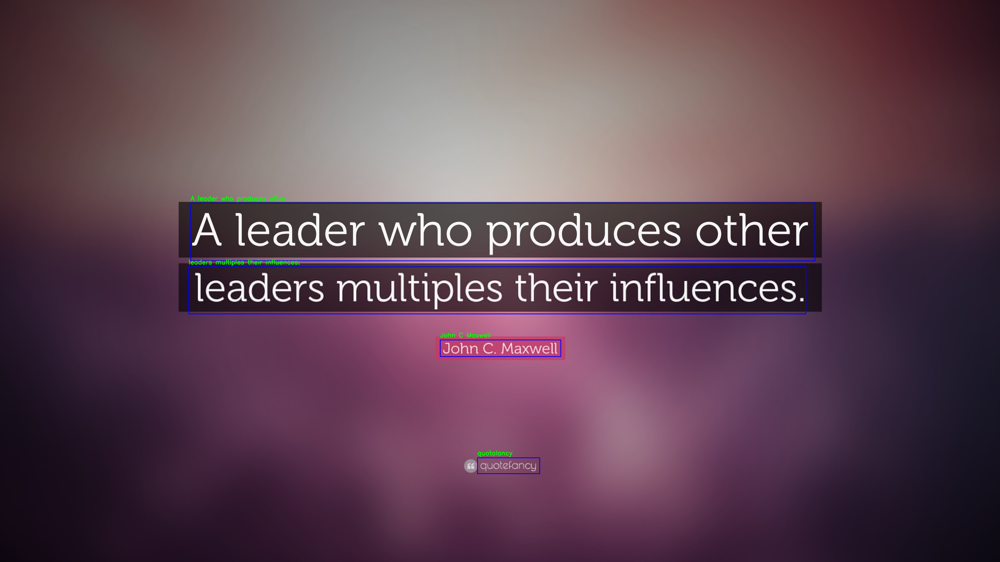

final text = A leader who produces other leaders multiples their influences: John C Maxwell quotalancy


In [23]:
# loop over the results
from google.colab.patches import cv2_imshow
texts = []
for (bbox, text, prob) in results:
	# display the OCR'd text and associated probability
	print("[INFO] {:.4f}: {}".format(prob, text))

	# unpack the bounding box
	(tl, tr, br, bl) = bbox
	tl = (int(tl[0]), int(tl[1]))
	tr = (int(tr[0]), int(tr[1]))
	br = (int(br[0]), int(br[1]))
	bl = (int(bl[0]), int(bl[1]))

	# cleanup the text and draw the box surrounding the text along
	# with the OCR'd text itself
	texts.append(cleanup_text(text))
	cv2.rectangle(img, tl, br, (255, 0, 0), 2)
	cv2.putText(img, text, (tl[0], tl[1] - 10),
	cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)

# show the output image
cv2_imshow(img)
print(f'final text = {" ".join(texts)}')